In [141]:
import sys # for automation and parallelization: set manual to false when run by a launcher
import json
default = {'scenario': 'base','training_folder':'../..'} # Default execution parameters
manual, argv = (True, default) if 'ipykernel' in sys.argv[0] else (False, dict(default, **json.loads(sys.argv[1])))


In [142]:
import os
import time
import geopandas as gpd
import pandas as pd
import numpy as np
sys.path.insert(0, r'../../../quetzal') # Add path to quetzal
from sklearn.neighbors import NearestNeighbors
from numba import jit, njit
import numba as nb
from quetzal.model import stepmodel
from shapely.geometry import LineString
from quetzal.io.gtfs_reader.importer import get_epsg
from quetzal.io import excel
on_lambda = bool(os.environ.get('AWS_EXECUTION_ENV'))
num_cores = nb.config.NUMBA_NUM_THREADS
print('num cores:',num_cores)

io_engine= 'pyogrio' if on_lambda else 'pyogrio' #or fiona

num cores: 8


In [143]:
scenario = argv['scenario']

on_lambda = bool(os.environ.get('AWS_EXECUTION_ENV'))
print('On Lambda : ', on_lambda)

training_folder = argv['training_folder']
input_folder = training_folder +r'/inputs/'

if not on_lambda:
    scenario_folder = training_folder + '/scenarios/' + scenario + '/inputs/'
    output_folder = training_folder + '/scenarios/' + scenario + '/outputs/'
    model_folder = training_folder + '/scenarios/' + scenario + '/model/'
else:
    scenario_folder = input_folder
    output_folder = training_folder + '/outputs/'
    model_folder = training_folder + '/model/'
print('input folder: ', input_folder)
print('output folder: ', output_folder)
print('scen folder : ', scenario_folder)
print('model folder : ', model_folder)

On Lambda :  False
input folder:  ../../inputs/
output folder:  ../../scenarios/base/outputs/
scen folder :  ../../scenarios/base/inputs/
model folder :  ../../scenarios/base/model/


In [144]:
if 'params' in argv.keys():
    var = excel.read_var(file=input_folder+'parameters.xlsx', scenario=scenario, return_ancestry=False)
    var.update(pd.DataFrame.from_dict(argv['params'], orient="index").stack())
else:
    var = excel.read_var(file=input_folder+'parameters.xlsx', scenario=scenario, return_ancestry=False)
    

# import model

In [145]:
sm = stepmodel.read_zippedpickles(model_folder +'los')
sm.segments = ['car_owner', 'pt_captive'] 


zones: 100%|██████████| 28/28 [00:00<00:00, 116.51it/s]    


In [146]:
if var['logit']['vol_calib']:
    vol_calib = pd.read_csv(scenario_folder  + r'calibration/volume_od_calibration.csv', index_col=0)
    vol_calib = vol_calib.merge(sm.zones_before_clustering['cluster'], left_on='origin', right_index=True, how='left')
    vol_calib = vol_calib.merge(sm.zones_before_clustering['cluster'], left_on='destination', right_index=True, how='left', suffixes= ('_origin', '_destination'))
    vol_calib.dropna(inplace=True)
    vol_calib['origin'] = 'zone_' + vol_calib['cluster_origin'].astype(int).astype(str)
    vol_calib['destination'] = 'zone_' + vol_calib['cluster_destination'].astype(int).astype(str)
    vol_calib['car_owner'] = vol_calib['volume_car']
    vol_calib['pt_captive'] = vol_calib['volume_pt'] + vol_calib['volume_walk']
    vol_calib=vol_calib[['origin', 'destination', 'car_owner', 'pt_captive']]
    sm.volumes = vol_calib

In [147]:
kwargs = var['preparation_logit'].to_dict()

utility_scale = var['preparation_logit']['time']
kwargs['transfers'] = -kwargs['transfers']/utility_scale # From min/transfer to pt/transfer
kwargs['price'] = -60/kwargs['price']/utility_scale # From 
kwargs['time'] = -1/utility_scale/60 # From min/pt to pt/sec



In [148]:
sm.preparation_logit(
    segments=['car_owner', 'pt_captive'],
    **kwargs
)

In [149]:
sm.utility_values.T

value,time,price,ntransfers,mode_utility
segment,,,,
root,-0.000556,-0.133333,-0.333333,1.0
car_owner,-0.000556,-0.133333,-0.333333,1.0
pt_captive,-0.000556,-0.133333,-0.333333,1.0


In [150]:
sm.logit_scales.T 

route_type,car,root,walk,bus,pt
segment,,,,,
root,0.0,1.0,0.0,0.1,0.5
car_owner,0.0,1.0,0.0,0.1,0.5
pt_captive,0.0,1.0,0.0,0.1,0.5


In [151]:
sm.mode_utility.T

route_type,car,root,walk,bus
segment,,,,
root,0,0,0,0
car_owner,0,0,0,0
pt_captive,0,0,0,0


In [152]:
sm.mode_utility.loc[:,['pt_captive']] = var.mode_utility_pt
sm.mode_utility.loc[:,['car_owner']] = var.mode_utility_car
sm.mode_utility= sm.mode_utility.fillna(0)

In [153]:
sm.mode_utility.T

route_type,car,root,walk,bus
segment,,,,
root,0.0,0.0,0.0,0.0
car_owner,-10.0,0.0,0.0,0.0
pt_captive,-600.0,0.0,0.0,0.0


In [154]:
sm.mode_nests.T 

route_type,car,root,walk,bus,pt
segment,,,,,
root,root,NaN,root,pt,root
car_owner,root,NaN,root,pt,root
pt_captive,root,NaN,root,pt,root


In [155]:
sm.pt_los['ntransfers'] = sm.pt_los['alighting_links'].apply(lambda x: max(len(x)-1, 0))
sm.pt_los['price'] = 0 
sm.car_los['ntransfers'] = 0
sm.car_los['price'] = 0

In [156]:
sm.analysis_pt_time(
        boarding_time=None,
        alighting_time=None,
        walk_on_road=True,
    )


sm.analysis_car_route_type() 

sm.los = pd.concat([sm.pt_los, sm.car_los]).reset_index(drop=True)
sm.los['path'] = sm.los['path'].apply(lambda p: tuple(p)) 


sm.analysis_mode_utility(how='mean')

100%|██████████| 2/2 [00:00<00:00, 450.32it/s]


In [157]:
walking_cutoff = var['logit']['walking_cutoff']
sm.los = sm.los.loc[~(sm.los['route_type']=='walk') | (sm.los['time'] < walking_cutoff)]

In [158]:
sm.initialize_logit()
sm.step_logit()

  0%|          | 0/10 [00:00<?, ?it/s]

100%|██████████| 10/10 [00:00<00:00, 31.71it/s]


In [159]:
sm.volumes.fillna(0, inplace=True)
sm.compute_los_volume(keep_segments=False)

In [160]:
sm.car_los = sm.los.loc[sm.los['route_type'] == 'car']
sm.pt_los = sm.los.loc[sm.los['route_type'] != 'car']

In [161]:
if os.path.isfile(scenario_folder+'/calibration/road_volume.csv'):
    road_vol=sm.copy()
    road_vol.volumes = pd.read_csv(scenario_folder+'/calibration/road_volume.csv',index_col=0)
    road_vol.los=road_vol.car_los 


    v = road_vol.volumes.set_index(['origin', 'destination']).sum(axis=1)
    od_set = set(v.loc[v>0].index)
    road_vol.road_links['time_ff'] = road_vol.road_links['length']/(road_vol.road_links['speed']*1000/3600)
    road_vol.step_road_pathfinder(method='aon', access_time='time',volume_column= 'car_owner',  time_column='time_ff', od_set=od_set,path_analysis=True )
    road_vol.los = pd.concat([road_vol.los, road_vol.car_los])   
    
    road_vol.volumes['pt_captive'] = 0
    road_vol.step_assignment(road=True)


In [162]:
sm.step_assignment(    
    road = True,
    boardings=True,
    alightings=True,
    transfers=True,
    boarding_links=True
)

In [163]:
if os.path.isfile(scenario_folder+'/calibration/road_volume.csv'):
    sm.road_links['volume_car_calib'] = road_vol.road_links[('volume', 'car')].fillna(0)
    sm.road_links[('volume', 'car')] = sm.road_links[('volume', 'car')].fillna(0) + sm.road_links['volume_car_calib']
    sm.los = pd.concat([sm.los, road_vol.car_los])

In [164]:
sm.to_zippedpickles(model_folder + 'logit_assignment')

utilities: 100%|██████████| 37/37 [00:00<00:00, 45.43it/s] 


'''
demand = sm.copy()
demand.car_los['car_owner']= demand.car_los['car_owner'].multiply(demand.probabilities.loc[demand.probabilities['segment']=='car']['car'])
demand.volumes['car_owner']= demand.volumes['car_owner'].multiply(demand.probabilities.loc[demand.probabilities['segment']=='car']['car'])
demand.step_car_assignment()
sm.demand_los = demand.car_los
'''

sm.links.rename(columns={'load': 'volume'}, inplace=True)
sm.analysis_pt_length(
     walk_on_road=True
)
sm.analysis_car_length()
sm.analysis_pt_time(
     walk_on_road=True
)

# stack

sm.summary_link_max(inplace=True)
sm.summary_link_sum(inplace=True)
sm.summary_od(inplace=True)
sm.los = pd.concat([sm.pt_los, sm.car_los]).reset_index(drop=True)

sm.summary_path_average(inplace=True)
sm.summary_aggregated_path_average(inplace=True, pt_route_types=['subway', 'bus', 'tram', 'rail'])
sm.summary_path_sum(inplace=True)

s = sm.stack_link_sum.unstack([-1, -2]).groupby(level=0).sum().stack([0, 1])
s.name = 'sum'
sm.stack_aggregated_link_sum = s 
s = sm.stack_link_max.unstack().groupby(level=0).max().stack()
s.name = 'max'
sm.stack_aggregated_link_max = s

In [165]:
if var["calibration"]["sortie"] == False:
    end_of_notebook

# Calibration

In [166]:
from syspy.syspy_utils.pandas_utils import groupby_weighted_average
from syspy.spatial.spatial import nearest_geometry
import matplotlib.pyplot as plt
def near_nodes(nodes,zones,div_neighbors = 2):
    node_proxim = nearest_geometry(nodes,zones,n_neighbors = int(len(zones)/div_neighbors),n_neighbors_centroid = int(len(zones)/div_neighbors))
    node_proxim = node_proxim.sort_values(by = "actual_distance")
    node_proxim =  node_proxim.drop_duplicates(["ix_one"])
    return(node_proxim.set_index(["ix_one"])["ix_many"].to_dict())

In [167]:
los = sm.los[['origin', 'destination','route_type', 'volume']]
los = los.groupby(['origin', 'route_type']).sum()
los = los.unstack('route_type')['volume']
los.columns = los.columns.values
los['volume'] = los.sum(axis=1)
los['pt'] = los[list(set(los.columns) - {'car', 'walk', 'volume'})].sum(axis=1)

los['part_car'] = los['car']/los[['car', 'pt', 'walk']].sum(axis=1) 
los['part_pt'] = los['pt']/los[['car', 'pt', 'walk']].sum(axis=1) 
los['part_walk'] = los['walk']/los[['car', 'pt', 'walk']].sum(axis=1) 
part_model = los[['part_car', 'part_pt', 'part_walk','volume']]

In [168]:
zones_before_clustering = sm.zones_before_clustering.copy()
zones_before_clustering["cluster"] = 'zone_' + zones_before_clustering["cluster"].astype(str) 
zones = zones_before_clustering

In [169]:
# part modale model sub_mode
print("part modale model"+ '\n',((sm.los.groupby("route_type")["volume"].sum()/sm.los["volume"].sum())*100).round(2).astype(str))

part modale model
 route_type
bus     27.41
car     28.86
walk    43.73
Name: volume, dtype: object


### macro

In [170]:
macro_file = scenario_folder  + r'calibration/zones_macro.geojson'
macro_file_provided = os.path.isfile(macro_file)
if macro_file_provided:
    import shapely as shp
    macro_zones = gpd.read_file(macro_file, engine= io_engine).to_crs(sm.zones.crs)

    macro_zones = macro_zones.groupby("macro_zones")['geometry'].apply(shp.ops.cascaded_union)
    centroid = gpd.GeoDataFrame(sm.zones.centroid).rename(columns = {0:"geometry"})
    
    dico_macro_zones = near_nodes(centroid,macro_zones)

nearest_link: 100%|██████████| 464/464 [00:00<00:00, 240474.12it/s]


## Import calibration data

In [171]:
calib_folder = scenario_folder  + r'calibration/'
calib_file = scenario_folder  + r'calibration/part_modale_calibration.csv'
calib_file_provided = os.path.isfile(calib_file)
if calib_file_provided:
    part_calibration_zone_bc = pd.read_csv(calib_file).set_index("index")
    
    part_calibration = part_calibration_zone_bc.merge(zones["cluster"], left_index = True, right_index = True, how = "left").set_index("cluster")
    part_calibration = groupby_weighted_average(part_calibration, part_calibration.index , ['part_car', 'part_pt', 'part_walk', 'volumes_calibration'], 'volumes_calibration')

In [172]:
if calib_file_provided:
    sm.zones.loc[part_calibration.index]['population'].sum(), sm.zones['population'].sum()

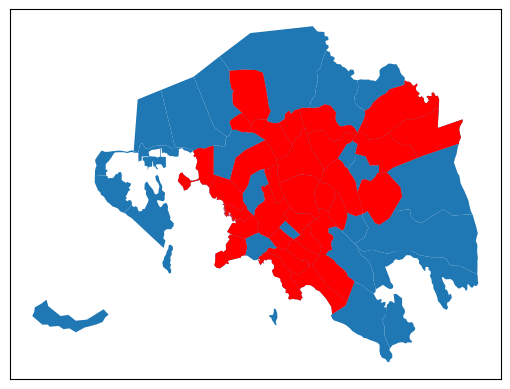

In [173]:
# il peut manquer des zones à la calibration
if calib_file_provided:
    ax = sm.zones_poly.plot()
    sm.zones_poly.loc[part_calibration.index].plot(color ="r" ,ax =ax)
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)
    plt.savefig(output_folder+'08_Zones_calibration.png',bbox_inches='tight', dpi=150)
    plt.show()


In [174]:
if calib_file_provided:
    comp_part_modale = part_calibration.merge(part_model, left_index=True, right_index=True, suffixes=('_calibration', '_model')).fillna(0)
    if macro_file_provided:
            comp_part_modale_macro = comp_part_modale .copy()
            comp_part_modale_macro.index = comp_part_modale_macro.index.to_series().apply(lambda x : dico_macro_zones[x])
            volume_macro_zone = comp_part_modale_macro.groupby(comp_part_modale_macro.index)["volume"].sum().to_dict()
            comp_part_modale_macro = groupby_weighted_average(comp_part_modale_macro, comp_part_modale_macro.index, list(set(comp_part_modale_macro.columns) -  {'volume'}), 'volume')
            comp_part_modale_macro["volume"] = comp_part_modale_macro.index.to_series().apply(lambda x : volume_macro_zone[x])
            comp_part_modale_macro = comp_part_modale_macro.sort_values(by = "volume",ascending = False)
else:
    comp_part_modale = part_model.fillna(0)
    if macro_file_provided:
        comp_part_modale_macro =  comp_part_modale.copy()
        comp_part_modale_macro.index = comp_part_modale_macro.index.to_series().apply(lambda x : dico_macro_zones[x])
        volume_macro_zone = comp_part_modale_macro.groupby(comp_part_modale_macro.index)["volume"].sum().to_dict()
        comp_part_modale_macro = groupby_weighted_average(comp_part_modale_macro, comp_part_modale_macro.index, list(set(comp_part_modale_macro.columns) -  {'volume'}), 'volume')
        comp_part_modale_macro["volume"] = comp_part_modale_macro.index.to_series().apply(lambda x : volume_macro_zone[x])
        comp_part_modale_macro = comp_part_modale_macro.sort_values(by = "volume",ascending = False)
        comp_part_modale_macro = comp_part_modale_macro* 100

### sortie part modale pondérée globale

In [175]:
print("part modale model"+ '\n',((part_model[["part_car","part_pt","part_walk"]] * part_model[["volume"]].values).sum()/part_model[["volume"]].sum().sum()*100).round(2))

part modale model
 part_car     28.86
part_pt      27.41
part_walk    43.73
dtype: float64


In [176]:
if calib_file_provided:
     print("part modale calibration"+ '\n',(( part_calibration_zone_bc[["part_car","part_pt","part_walk"]] *  part_calibration_zone_bc[["volumes_calibration"]].values).sum()/ part_calibration_zone_bc[["volumes_calibration"]].sum().sum()*100).round(2))

part modale calibration
 part_car     21.02
part_pt      59.60
part_walk    19.37
dtype: float64


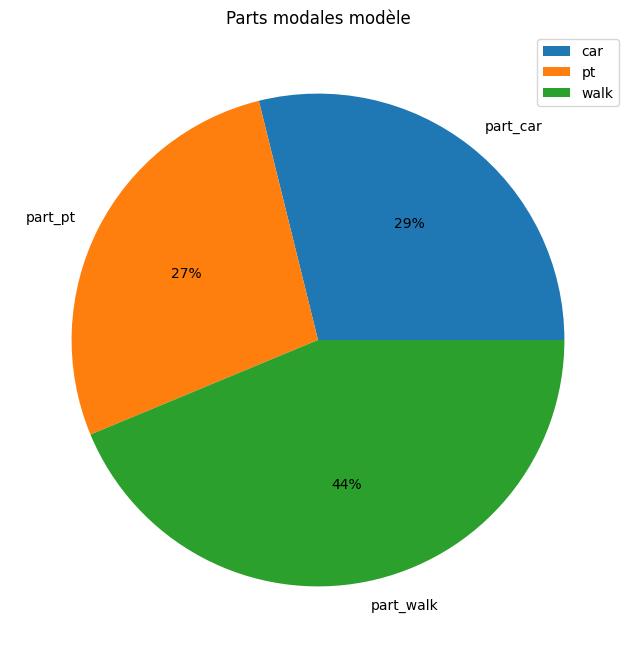

In [177]:
(((part_model[["part_car","part_pt","part_walk"]] * part_model[["volume"]].values).sum()/part_model[["volume"]].sum().sum()*100).round(2)).plot(kind='pie', autopct='%1.0f%%', figsize=[8,8])
plt.title('Parts modales modèle')
plt.legend(['car', 'pt', 'walk'])
plt.savefig(output_folder+'09_Parts_modales_modèle.png',bbox_inches='tight', dpi=150)


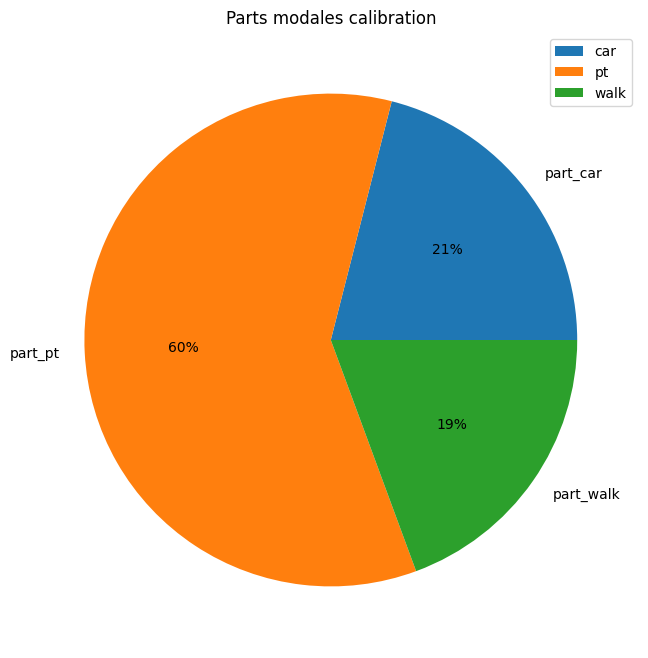

In [178]:
if calib_file_provided:
    (((part_calibration_zone_bc[["part_car","part_pt","part_walk"]] *  part_calibration_zone_bc[["volumes_calibration"]].values).sum()/ part_calibration_zone_bc[["volumes_calibration"]].sum().sum()*100).round(2)).plot(kind='pie', autopct='%1.0f%%', figsize=[8,8])
    plt.title('Parts modales calibration')
    plt.legend(['car', 'pt', 'walk'])
    plt.savefig(output_folder+'10_Parts_modales_calib.png',bbox_inches='tight', dpi=150)


## histrogramme compar macrozones

In [179]:
colors = ["#cf6006", "#3481ed" , "#fad83e", "#8dd0fc","#8C4B7D", "#A08C69","#647D6E", "#5A7382", "#64411E", "#A00037", "#643C5A"]  

In [180]:
comp_part_modale.corr()

,part_car_calibration,part_pt_calibration,part_walk_calibration,volumes_calibration,part_car_model,part_pt_model,part_walk_model,volume
part_car_calibration,1.000000,-0.904641,-0.227173,-0.172753,0.150710,0.072854,-0.207523,0.057607
part_pt_calibration,-0.904641,1.000000,-0.209521,-0.052275,-0.095248,-0.153388,0.227686,-0.019060
part_walk_calibration,-0.227173,-0.209521,1.000000,0.515815,-0.128133,0.183353,-0.044152,-0.088618
volumes_calibration,-0.172753,-0.052275,0.515815,1.000000,-0.207131,0.399514,-0.164105,-0.107057
part_car_model,0.150710,-0.095248,-0.128133,-0.207131,1.000000,-0.411013,-0.572639,0.036751
part_pt_model,0.072854,-0.153388,0.183353,0.399514,-0.411013,1.000000,-0.511999,-0.080419
part_walk_model,-0.207523,0.227686,-0.044152,-0.164105,-0.572639,-0.511999,1.000000,0.037691
volume,0.057607,-0.019060,-0.088618,-0.107057,0.036751,-0.080419,0.037691,1.000000


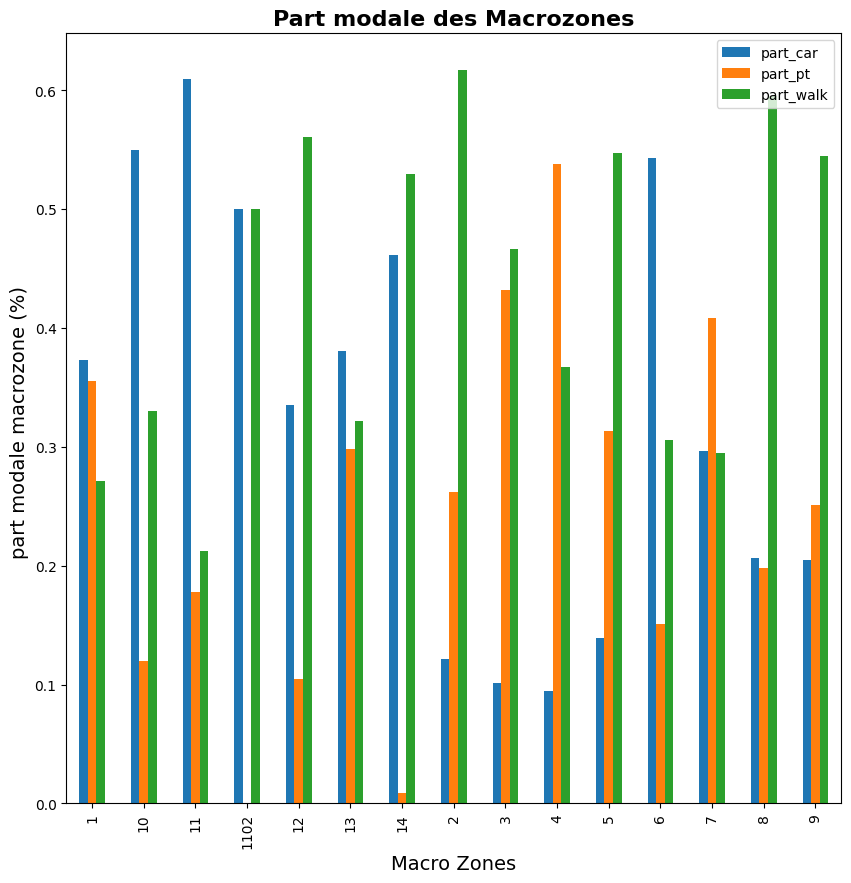

In [181]:
if macro_file_provided:
    part_macro = los.copy()
    part_macro.index = part_macro.index.to_series().apply(lambda x : dico_macro_zones[x])
    part_macro = part_macro.groupby(part_macro.index)[['car', 'pt', 'walk', 'volume']].sum()
    part_macro['part_car'] = part_macro['car']/part_macro['volume']
    part_macro['part_pt'] = part_macro['pt']/part_macro['volume']
    part_macro['part_walk'] = part_macro['walk']/part_macro['volume']
    part_macro[['part_car', 'part_pt', 'part_walk']].plot( kind = 'bar', figsize=[10, 10])
    plt.xlabel('Macro Zones', fontsize=14)
    plt.ylabel('part modale macrozone (%) ', fontsize=14)
    plt.title('Part modale des Macrozones', loc='center', fontsize=16, fontweight="bold")
    plt.savefig(output_folder+'11_Part_modale_macrozones.png',bbox_inches='tight', dpi=150)
    plt.show()

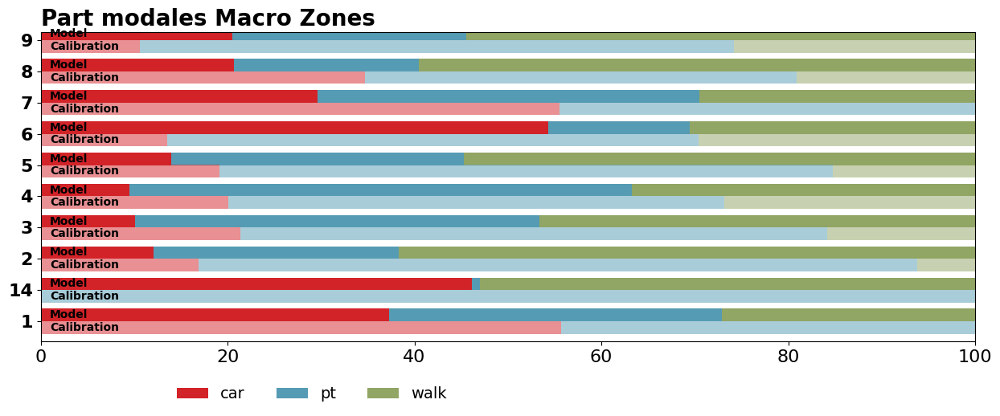

In [182]:
if macro_file_provided and calib_file_provided:
    fig, ax = plt.subplots()
    systra_color = ["#D22328", "#559BB4", "#91A564", "#DC9100", "#8C4B7D", "#A08C69","#647D6E", "#5A7382", "#64411E", "#A00037", "#643C5A"]

    w = 0.4
    modes = ['car', 'pt', 'walk']

    part_calibration_macro = part_calibration.copy()
    part_calibration_macro.index = part_calibration_macro.index.to_series().apply(lambda x : dico_macro_zones[x])
    part_calibration_macro= groupby_weighted_average(part_calibration_macro, part_calibration_macro.index , ['part_car', 'part_pt', 'part_walk'], 'volumes_calibration')
    part_calibration_macro= part_calibration_macro.rename_axis('origin')
    part_calibration_comp = part_calibration_macro.merge(part_macro[['part_car', 'part_pt', 'part_walk']], left_index=True, right_index=True, suffixes=("_calibration", '_model'))

    to_plot = part_calibration_comp[['part_car_model', 'part_pt_model', 'part_walk_model']]*100
    to_plot.plot(kind='barh', stacked=True, figsize=[15, 5], fontsize=16, color=systra_color, ax=ax, width=w, position=0)
    share_pro = to_plot.copy()

    to_plot = part_calibration_comp[['part_car_calibration', 'part_pt_calibration', 'part_walk_calibration']]*100
    to_plot.plot(kind='barh', stacked=True, figsize=[15, 5], fontsize=16, color=systra_color, ax=ax, width=w, position=1.0, alpha=0.5)
    plt.legend(modes, fontsize=14, bbox_to_anchor=(0.45, -0.1), ncol=len(modes), frameon=False)
    plt.title('Part modales Macro Zones', loc='left', fontsize=20, fontweight="bold")
    plt.xlim([0, 100])
    plt.ylabel(None)
    plt.yticks(ticks=range(len(part_calibration_comp)), labels=part_calibration_comp.index, fontweight='bold')

    for j in range(len(part_calibration_comp)):
        plt.annotate('Model', xy=(1, j + 0.5*w), ha='left', va='center', fontweight='bold')
        plt.annotate('Calibration', xy=(1, j - 0.5*w), ha='left', va='center', fontweight='bold')

    name = 'Part modales Macro Zones'
    fig.savefig(os.path.join(output_folder + '12_Part_comp_macrozones.png'), bbox_inches='tight', dpi=150)
    plt.show()

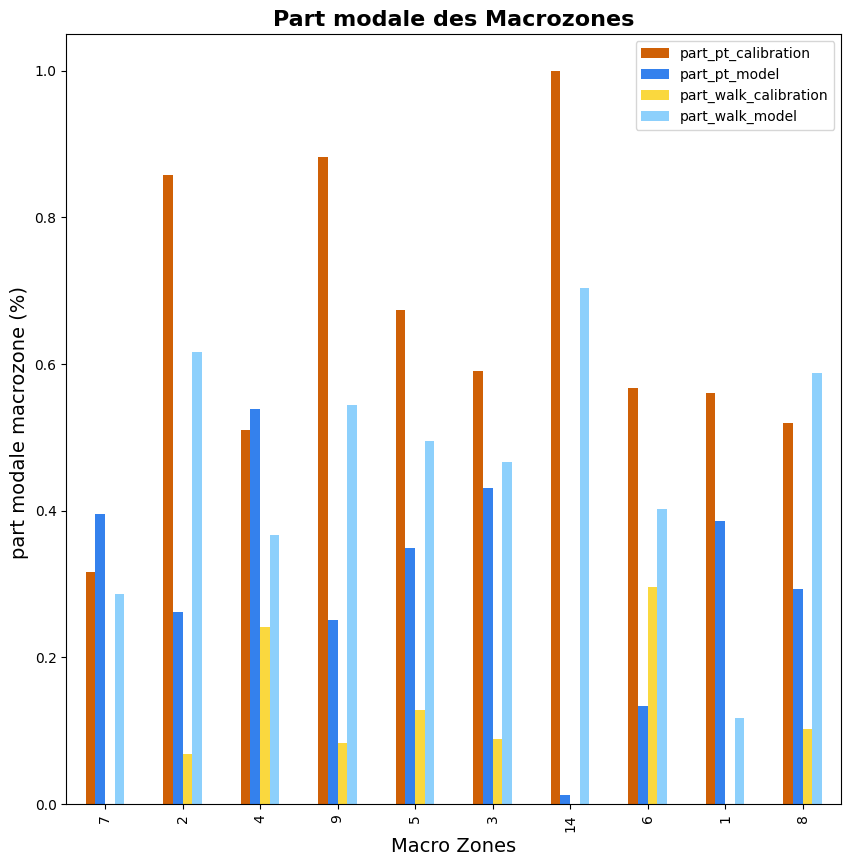

In [183]:

if macro_file_provided and calib_file_provided :
    comp_part_modale_macro[['part_pt_calibration','part_pt_model','part_walk_calibration','part_walk_model']].plot( kind = 'bar', figsize=[10, 10],color = colors)
    plt.xlabel('Macro Zones', fontsize=14)
    plt.ylabel('part modale macrozone (%) ', fontsize=14)
    plt.title('Part modale des Macrozones', loc='center', fontsize=16, fontweight="bold")
    plt.savefig(output_folder+'part_modale_macrozones.png',bbox_inches='tight', dpi=150)
    plt.show()
elif macro_file_provided:
    comp_part_modale_macro[['part_pt','part_walk']].plot( kind = 'bar', figsize=[10, 10],color = colors)
    plt.xlabel('Macro Zones', fontsize=14)
    plt.ylabel('part modale macrozone (%) ', fontsize=14)
    plt.title('Part modale des Macrozones', loc='center', fontsize=16, fontweight="bold")
    plt.savefig(output_folder+'13_Part_modale_macrozones_calib.png',bbox_inches='tight', dpi=150)
    plt.show()

In [184]:
if macro_file_provided:
    pt_los_macro = sm.pt_los.copy()
    pt_los_macro['macro_origin'] = pt_los_macro['origin'].map(dico_macro_zones)
    pt_los_macro['macro_destination'] = pt_los_macro['destination'].map(dico_macro_zones)
    pt_los_macro = pt_los_macro.groupby('macro_origin')['time'].mean()
    pt_los_macro

# boardings

In [185]:
calib_file__boardings_provided = os.path.isfile(input_folder + scenario + '/calibration/''calib_boardings.csv')
if calib_file__boardings_provided: 
    calib_boardings = pd.read_csv(input_folder + scenario + '/calibration/''calib_boardings.csv')


In [186]:
sm.links.groupby(['route_type'])['boardings'].sum()

route_type
bus    446291.832114
Name: boardings, dtype: float64

In [187]:
sm.links.groupby(['agency_id'])['boardings'].sum()

agency_id
NCD    108132.325199
PMV    338159.506915
Name: boardings, dtype: float64

In [188]:
sm.links.groupby('route_id')['boardings'].sum().to_csv(os.path.join(output_folder,'boardings_route_type.csv'))

In [189]:
sm.links.loc[sm.links['agency_id'] == 'QUENEDI'].groupby('route_id')['boardings'].sum()

Series([], Name: boardings, dtype: float64)

In [190]:
if os.path.isfile(calib_folder+ 'calib_boardings_bus.csv'):
    bus = pd.read_csv(calib_folder + 'calib_boardings_bus.csv') 
    bus.plot()

# road

In [191]:
if os.path.isfile(calib_folder + 'road_counts.csv'):
    road_counts = pd.read_csv(calib_folder + 'road_counts.csv', index_col='index')
    road_counts['count_total'] = road_counts['car'] + road_counts['pmv'] + road_counts['truck']
    road_links_counts = sm.road_links.merge(road_counts, left_index=True, right_index=True, how='right')

    road_links_counts = road_links_counts.drop('index', axis=1)
    road_links_counts.columns=[str(c) for c in road_links_counts.columns]
    road_links_counts[["('volume', 'pt')","('volume', 'car')"] ] = road_links_counts[["('volume', 'pt')","('volume', 'car')"] ].fillna(0)
    road_links_counts['load'] = road_links_counts["('volume', 'pt')"] + road_links_counts["('volume', 'car')"]
    road_links_counts = gpd.GeoDataFrame(road_links_counts, crs=sm.zones.crs).to_crs(epsg=4326)
    #road_links_counts.drop('index', axis=1).to_file(os.path.join(output_folder, 'road_links_counts.geojson'))
    road_links_counts.to_file(os.path.join(output_folder, 'road_links_counts.geojson'))
        

## Od analysis

In [192]:
sm.analysis_pt_time(
     walk_on_road=True
)

In [193]:
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

In [194]:
od_file = scenario_folder + 'od/od.geojson'
od_file_provided = os.path.isfile(od_file)
if od_file_provided and manual:
    od_test = gpd.read_file(od_file, engine= io_engine)
    from shapely.geometry import Point
    from syspy.spatial.spatial import nearest, agglomerative_clustering, voronoi_diagram_dataframes, add_geometry_coordinates
    od_test['geometry_o'] = od_test['geometry'].apply(lambda g: Point(g.coords[:][0]))
    od_test['geometry_d'] = od_test['geometry'].apply(lambda g: Point(g.coords[:][1]))
    # find nearest node with KNN. nodes are now the origin and destination.
    od_test['geometry'] = od_test['geometry_o']
    neigh = nearest(od_test, sm.zones.to_crs(4326), n_neighbors=1).rename(columns={'ix_one': 'zone_index', 'ix_many': 'node_index'})
    zone_node_dict = neigh.set_index('zone_index')['node_index'].to_dict()
    od_test['origin'] = od_test.index.map(zone_node_dict.get)

    od_test['geometry'] = od_test['geometry_d']
    neigh = nearest(od_test, sm.zones.to_crs(4326), n_neighbors=1).rename(columns={'ix_one': 'zone_index', 'ix_many': 'node_index'})
    zone_node_dict = neigh.set_index('zone_index')['node_index'].to_dict()
    od_test['destination'] = od_test.index.map(zone_node_dict.get)

    od_test = od_test.drop(columns=['geometry_o','geometry_d','geometry'])
    od_test = od_test.drop(columns=['index'])

    od_list = od_test[['origin','destination','name']].values.tolist()
    


Reprojecting model from epsg 32755 to epsg 3857: 100%|██████████| 37/37 [00:01<00:00, 32.17it/s]


no path found for OD = zone_36 zone_32


100%|██████████| 4/4 [00:02<00:00,  1.56it/s]


no path found for OD = zone_36 zone_4


100%|██████████| 1/1 [00:00<00:00,  2.23it/s]


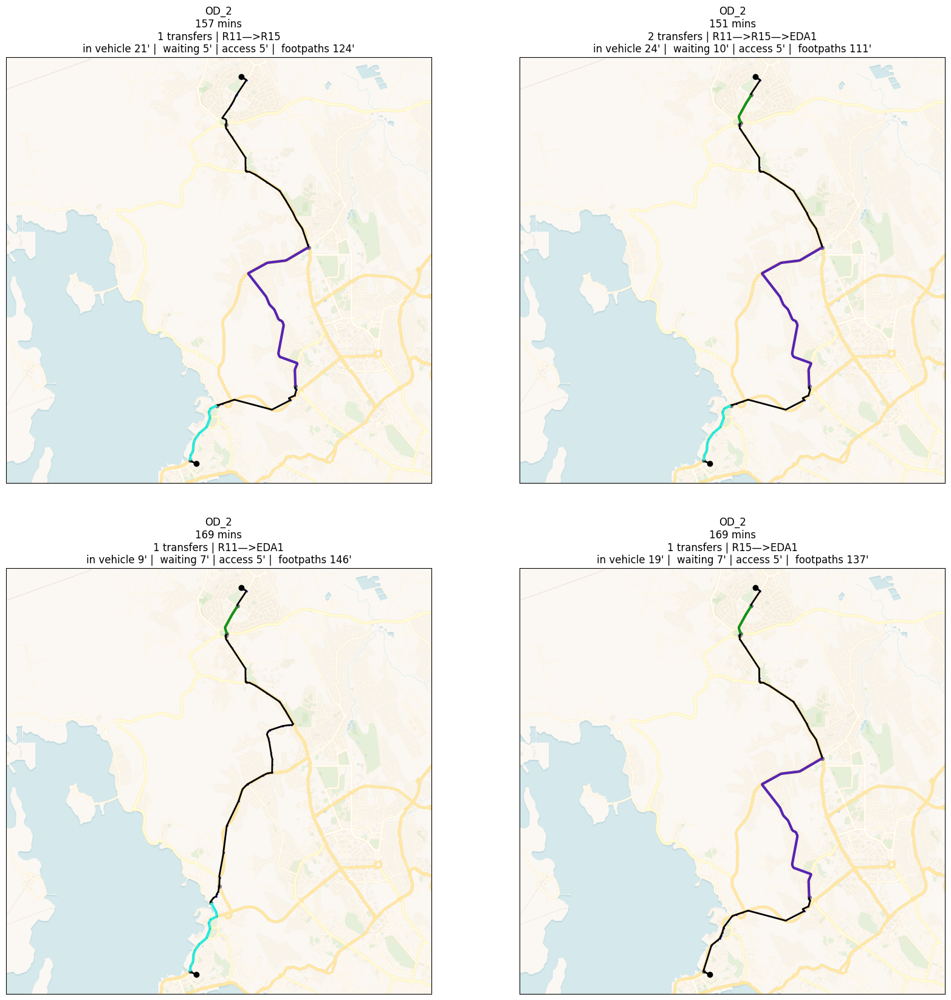

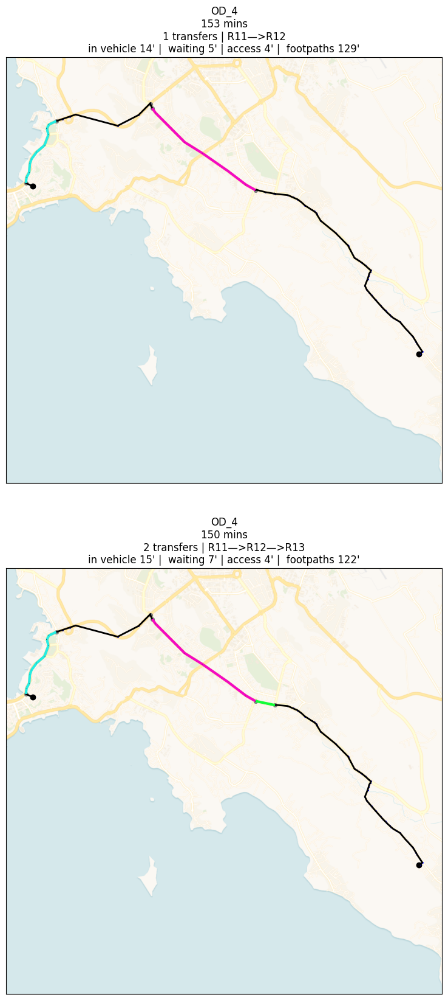

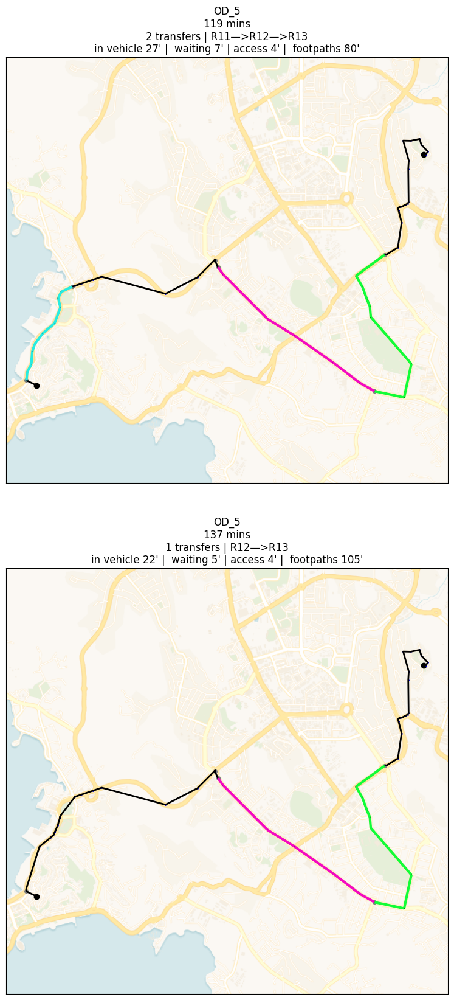

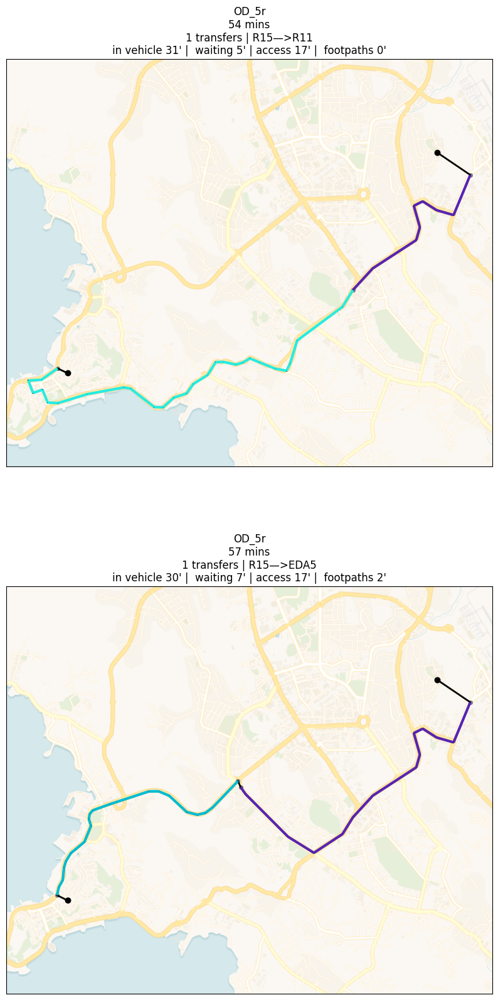

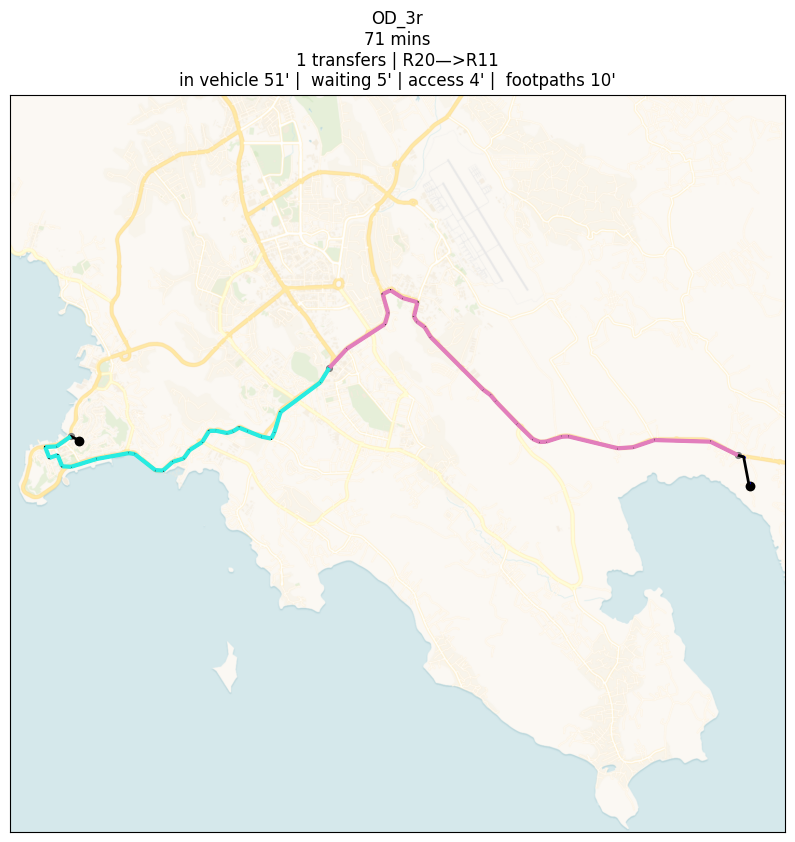

...

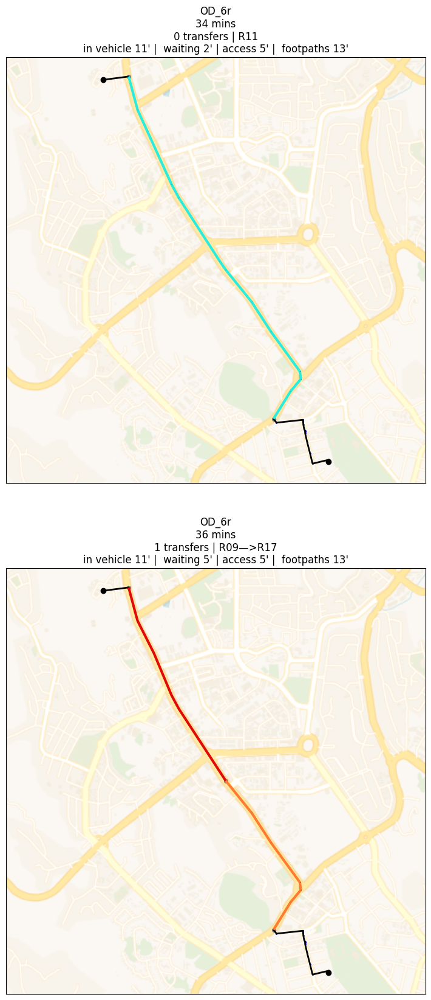

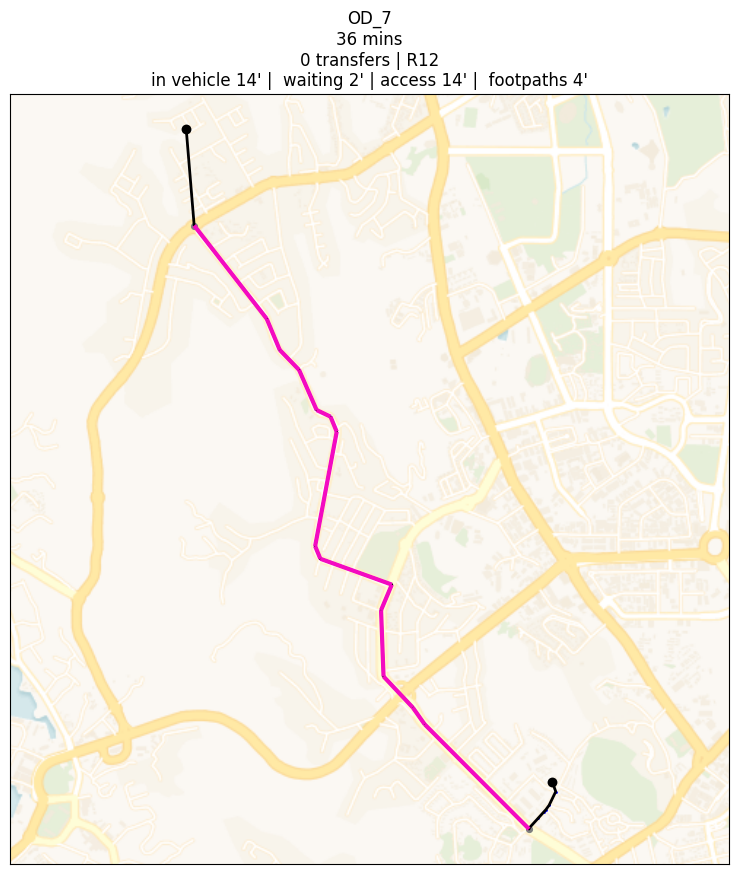

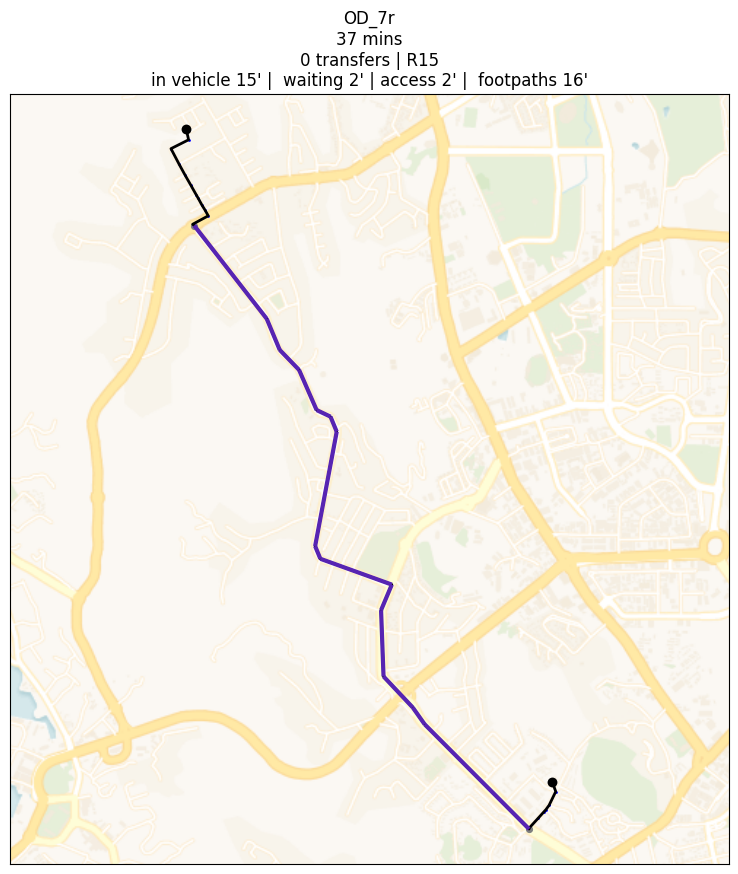

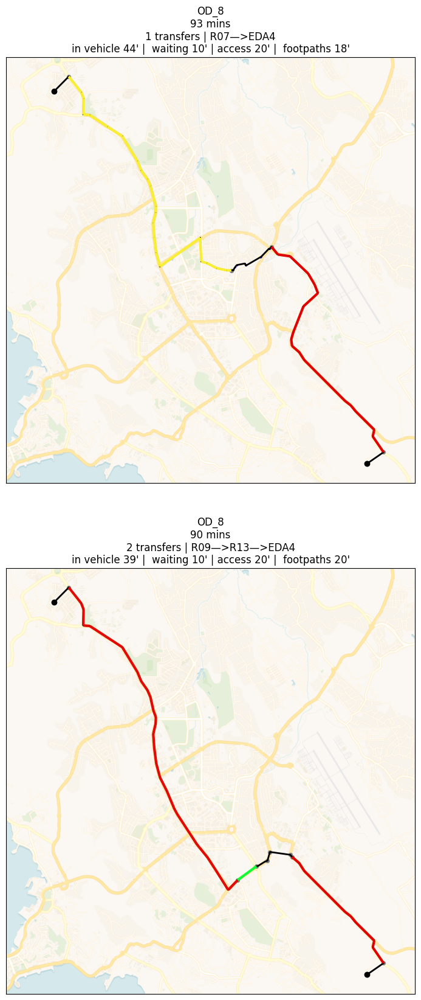

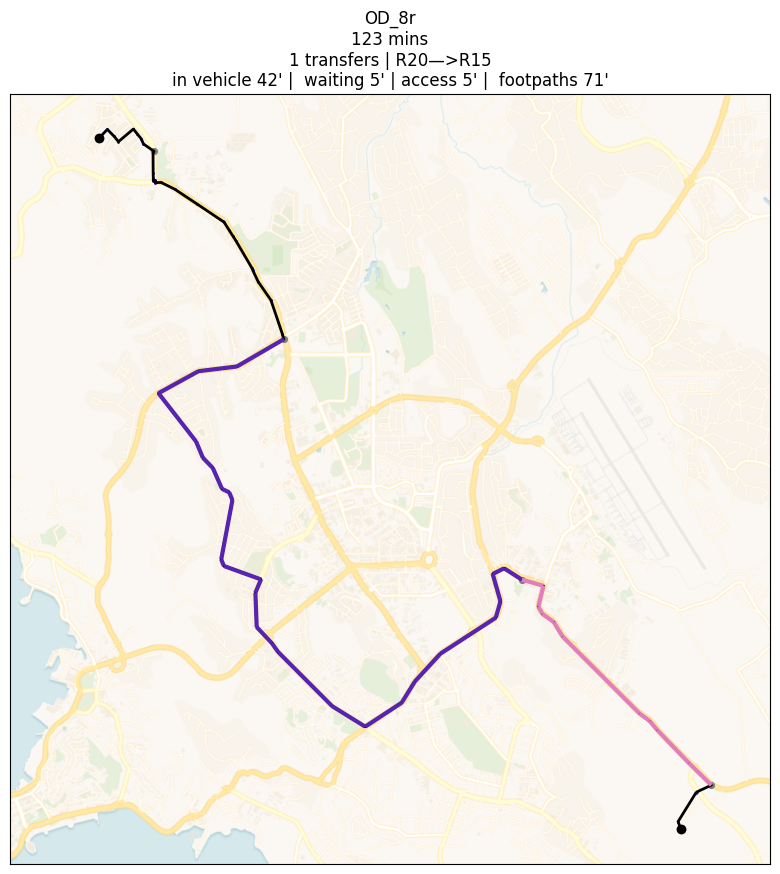

In [195]:
if manual:
    import matplotlib.pyplot as plt

    plot_sm = sm.copy()
    plot_sm.analysis_pt_time(
        walk_on_road=True
    )
    
    los = plot_sm.pt_los
    link_routes = plot_sm.links['route_short_name'].to_dict()
    def link_path_to_routes(link_path):
        routes = [link_routes[l] for l in link_path]
        used = set()
        rsn = []
        for route in routes:
            if route not in used:
                rsn.append(route)
            used.add(route)
        return rsn
    los['route_path'] = los['link_path'].apply(link_path_to_routes)

    def title(paths):
        paths['min'] = np.round(paths['time'] / 60).astype(int)
        mins = (paths[['in_vehicle_time', 'access_time', 'footpath_time', 'waiting_time', 'time']] / 60).astype(int).astype(str)
        title =  paths['min'].astype(str) + ' mins'
        title += '\n' + paths['ntransfers'].astype(str) + ' transfers | '

        title += paths['route_path'].apply(lambda l: '—>'.join(l) )
        title += '\n' + 'in vehicle '+ mins['in_vehicle_time']+ "' | " + ' waiting '+ mins['waiting_time']+ "' | "  
        title += 'access ' + mins['access_time']+ "' | "   + ' footpaths '  + mins['footpath_time']+ "'"   
        return title
    los['title'] = title(los)


    los = los.loc[los[('pt_captive', 'probability')] > 0.01]
    plot_sm.pt_los = los.sort_values(('pt_captive', 'probability'), ascending=False)

    plot_sm = plot_sm.change_epsg(epsg =3857, coordinates_unit = 'meter')

    plot_sm.links['color'] = '#' +plot_sm.links['route_color']

    styles = plot_sm.get_geometries()

    for o,d, name in od_list:
        try:
            origin, destination= o, d
            n =  len(plot_sm.pt_los.set_index(['origin', 'destination']).loc[[(origin, destination)]])
            rows = 1
            if n > 1:
                rows = 2
            if n > 6:
                rows = 3
            if n > 12:
                rows = 4
   
            columns = n // rows + bool(n%rows)
   
            url = 'http://a.basemaps.cartocdn.com/rastertiles/voyager_nolabels/{z}/{x}/{y}.png'
            fig, axes = plot_sm.plot_separated_paths(
                origin, destination, rows=rows, figsize=[10*columns, 10*rows],
                title='title', constrained_layout=False, styles = styles,
                basemap_url=url, zoom=14, squared=True,
            )
            for ax in axes:
                ax.set_title(name + '\n' + ax.get_title())
            png = output_folder+ 'OD_PT_' + name + '.png'
            fig.savefig(png, bbox_inches='tight')
        except KeyError:
            print('no path found for OD =', origin, destination)
            pass

# results

In [196]:
import sys # for automation and parallelization: set manual to false when run by a launcher
import json
 
default = {'scenario': 'base', 'training_folder':'../..'} # Default execution parameters
manual, argv = (True, default) if 'ipykernel' in sys.argv[0] else (False, dict(default, **json.loads(sys.argv[1])))


In [197]:
import os
import time
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math
sys.path.insert(0, r'../../../quetzal') # Add path to quetzal
from sklearn.neighbors import NearestNeighbors
from numba import jit, njit
import numba as nb
from quetzal.model import stepmodel
from shapely.geometry import LineString
from quetzal.io.gtfs_reader.importer import get_epsg
from quetzal.io import excel
on_lambda = bool(os.environ.get('AWS_EXECUTION_ENV'))
num_cores = nb.config.NUMBA_NUM_THREADS
print('num cores:',num_cores)
from syspy.spatial import spatial, utils
io_engine= 'pyogrio' if on_lambda else 'pyogrio' #or fiona

num cores: 8


In [198]:
scenario = argv['scenario']

on_lambda = bool(os.environ.get('AWS_EXECUTION_ENV'))
print('On Lambda : ', on_lambda)

training_folder = argv['training_folder']
input_folder = training_folder +r'/inputs/'

if not on_lambda:
    scenario_folder = training_folder + '/scenarios/' + scenario  + '/inputs/'
    output_folder = training_folder + '/scenarios/' + scenario + '/outputs/'
    model_folder = training_folder + '/scenarios/' + scenario  + '/model/'
else:
    scenario_folder = input_folder
    output_folder = training_folder + '/outputs/'
    model_folder = training_folder + '/model/'
print('input folder: ', input_folder)
print('output folder: ', output_folder)
print('scen folder : ', scenario_folder)
print('model folder : ', model_folder)

On Lambda :  False
input folder:  ../../inputs/
output folder:  ../../scenarios/base/outputs/
scen folder :  ../../scenarios/base/inputs/
model folder :  ../../scenarios/base/model/


In [199]:
if 'params' in argv.keys():
    var = excel.read_var(file=input_folder+'parameters.xlsx', scenario=scenario, return_ancestry=False)
    var.update(pd.DataFrame.from_dict(argv['params'], orient="index").stack())
else:
    var = excel.read_var(file=input_folder+'parameters.xlsx', scenario=scenario, return_ancestry=False)

In [200]:
def round_up(n, decimals=0):
    multiplier = 10**decimals
    return math.ceil(n * multiplier) / multiplier

inputs

In [201]:
sm = stepmodel.read_zippedpickles(model_folder +'logit_assignment')
sm.segments = ['car_owner', 'pt_captive'] 

zones: 100%|██████████| 37/37 [00:00<00:00, 138.52it/s]    


In [202]:
sm = sm.change_epsg(4326,'degree')

Reprojecting model from epsg 32755 to epsg 4326: 100%|██████████| 37/37 [00:01<00:00, 32.06it/s]


emission/attraction

In [203]:
df = sm.zones_poly[['geometry']].copy()

In [204]:
emission = sm.volumes.groupby('origin').agg(sum)
emission.columns =  'emission_' + emission.columns

attraction = sm.volumes.groupby('destination').agg(sum)
attraction.columns =  'attraction_' + attraction.columns

In [205]:
df = df.merge(emission,left_index=True,right_index=True)
df = df.merge(attraction,left_index=True,right_index=True)

In [206]:
df.to_file(os.path.join(output_folder,'volumes.geojson'), driver='GeoJSON')

road

In [207]:
road_links = sm.road_links.drop('index', axis=1).copy()
road_links.columns=[str(c) for c in road_links.columns]
road_links[["('volume', 'pt')","('volume', 'car')"] ] = road_links[["('volume', 'pt')","('volume', 'car')"] ].fillna(0)
road_links['load'] = road_links["('volume', 'pt')"] + road_links["('volume', 'car')"]
road_links = gpd.GeoDataFrame(road_links, crs=sm.zones.crs).to_crs(epsg=4326)
#road_links.drop('index', axis=1).to_file(os.path.join(output_folder, 'road_links.geojson'))
road_links.to_file(os.path.join(output_folder, 'road_links.geojson'))

serpent de charge

In [208]:
gpd.GeoDataFrame(sm.nodes,crs=sm.epsg).to_crs(4326).to_file(os.path.join(output_folder,'loaded_nodes.geojson'), driver='GeoJSON')

In [209]:
gpd.GeoDataFrame(sm.links.drop('road_link_list', axis=1, errors='ignore'),crs=sm.epsg).to_file(os.path.join(output_folder,'loaded_links.geojson'), driver='GeoJSON')

boardings

In [210]:
pd.DataFrame(sm.links.groupby(['route_type'])['boardings'].sum()).to_csv(os.path.join(output_folder,'boardings_route_type.csv'))

In [211]:
pd.DataFrame(sm.links.groupby(['agency_id'])['boardings'].sum()).to_csv(os.path.join(output_folder,'boardings_agency.csv'))

In [212]:
pd.DataFrame(sm.links.groupby('route_id')['boardings'].sum()).to_csv(os.path.join(output_folder,'boardings_route_id.csv'))

In [213]:
pd.DataFrame(sm.links.loc[sm.links['agency_id'] == 'QUENEDI'].groupby('route_id')['boardings'].sum()).to_csv(os.path.join(output_folder,'boardings_quenedi.csv'))

los

In [214]:
los= sm.los.copy()
los.to_csv(os.path.join(output_folder, 'los.csv'))

In [215]:
los['route_type'].unique()

array(['walk', 'bus', 'car'], dtype=object)

In [216]:
car = los.loc[los['route_type'] == 'car', ['origin', 'destination', 'volume']].groupby(['origin', 'destination']).sum()
bus = los.loc[los['route_type'] == 'bus', ['origin', 'destination', 'volume']].groupby(['origin', 'destination']).sum()
walk = los.loc[los['route_type'] == 'walk', ['origin', 'destination', 'volume']].groupby(['origin', 'destination']).sum()
od_mode = car.merge(bus, on=['origin', 'destination'], how = 'outer', suffixes=('_car', '_bus') )
od_mode = od_mode.merge(walk, on=['origin', 'destination'], how = 'outer' ).rename(columns = {'volume':'volume_walk'}).fillna(0)
od_mode.to_csv(os.path.join(output_folder, 'od_mode.csv'))

zones

In [217]:
los = sm.los[['origin', 'destination','route_type', 'volume']]
los = los.groupby(['origin', 'route_type']).sum()
los = los.unstack('route_type')['volume']
los.columns = los.columns.values
los['volume'] = los.sum(axis=1)
los['pt'] = los[list(set(los.columns) - {'car', 'walk', 'volume'})].sum(axis=1)

los['part_car'] = los['car']/los[['car', 'pt', 'walk']].sum(axis=1) 
los['part_pt'] = los['pt']/los[['car', 'pt', 'walk']].sum(axis=1) 
los['part_walk'] = los['walk']/los[['car', 'pt', 'walk']].sum(axis=1) 
part_model = los[['part_car', 'part_pt', 'part_walk','volume']]

In [218]:
sm.zones.to_crs(epsg=4326).to_file(output_folder+ 'zones.geojson', driver='GeoJSON')

In [219]:
zones_part = sm.zones_poly.merge(part_model[['part_car', 'part_pt', 'part_walk']], left_index=True, right_index=True).fillna(0)
zones_part['principal_mode'] = zones_part[['part_car', 'part_pt', 'part_walk']].idxmax(axis=1)
zones_part.to_crs(epsg=4326).to_file(output_folder+ 'zones_part.geojson', driver='GeoJSON')

path

In [220]:
od_file = scenario_folder + 'od/od.geojson'
od_file_provided = os.path.isfile(od_file)
if od_file_provided:
    od_test = gpd.read_file(od_file, engine= io_engine)
    from shapely.geometry import Point
    from syspy.spatial.spatial import nearest
    od_test['geometry_o'] = od_test['geometry'].apply(lambda g: Point(g.coords[:][0]))
    od_test['geometry_d'] = od_test['geometry'].apply(lambda g: Point(g.coords[:][1]))
    # find nearest node with KNN. nodes are now the origin and destination.
    od_test['geometry'] = od_test['geometry_o']
    neigh = nearest(od_test, sm.zones.to_crs(4326), n_neighbors=1).rename(columns={'ix_one': 'zone_index', 'ix_many': 'node_index'})
    zone_node_dict = neigh.set_index('zone_index')['node_index'].to_dict()
    od_test['origin'] = od_test.index.map(zone_node_dict.get)

    od_test['geometry'] = od_test['geometry_d']
    neigh = nearest(od_test, sm.zones.to_crs(4326), n_neighbors=1).rename(columns={'ix_one': 'zone_index', 'ix_many': 'node_index'})
    zone_node_dict = neigh.set_index('zone_index')['node_index'].to_dict()
    od_test['destination'] = od_test.index.map(zone_node_dict.get)

    od_test = od_test.drop(columns=['geometry_o','geometry_d','geometry'])
    od_test = od_test.drop(columns=['index'])
else:
    end_of_notebook

In [221]:
#only keep best path
sm.pt_los = sm.pt_los[sm.pt_los['pathfinder_session'] == 'best_path']

In [222]:
if 'speed' not in sm.links.columns:
    sm.links['speed'] = sm.links['length']/sm.links['time']*3.6

In [223]:
#PT links
od_links = od_test.merge(sm.pt_los[['origin','destination','gtime','link_path','pathfinder_session']],
                         on=['origin','destination'])
od_links = od_links.drop(columns = ['origin','destination'])
od_links = od_links.explode('link_path')
od_links = od_links.merge(sm.links[['route_color','geometry','time','speed']],left_on='link_path',right_index=True)
od_links = od_links.drop(columns='link_path')

In [224]:
#ntlegs
od_ntlegs = od_test.merge(sm.pt_los[['origin','destination','gtime','ntlegs','pathfinder_session']],
                          on=['origin','destination'])
od_ntlegs = od_ntlegs.drop(columns = ['origin','destination'])
od_ntlegs = od_ntlegs.explode('ntlegs')
ntlegs_dict = sm.zone_to_transit.reset_index().set_index(['a','b'])['index'].to_dict()
od_ntlegs['ntlegs'] = od_ntlegs['ntlegs'].apply(ntlegs_dict.get)
od_ntlegs = od_ntlegs.merge(sm.zone_to_transit[['geometry','time','speed']],left_on='ntlegs',right_index=True)
od_ntlegs = od_ntlegs.drop(columns='ntlegs')

In [225]:
sm.footpaths['speed'] = sm.footpaths['length']/sm.footpaths['time']*3.6

In [226]:
#footpath
od_footpaths = od_test.merge(sm.pt_los[['origin','destination','gtime','footpaths','pathfinder_session']], 
                             on=['origin','destination'])
od_footpaths = od_footpaths.drop(columns = ['origin','destination'])
od_footpaths = od_footpaths.explode('footpaths')
footpaths_dict = sm.footpaths.reset_index().set_index(['a','b'])['index'].to_dict()
od_footpaths['footpaths'] = od_footpaths['footpaths'].apply(footpaths_dict.get)
od_footpaths = od_footpaths.merge(sm.footpaths[['geometry','time','speed']],left_on='footpaths',right_index=True)
od_footpaths = od_footpaths.drop(columns='footpaths')

In [227]:
# raod links (walk on road)
od_road = od_test.merge(sm.pt_los[['origin','destination','gtime','footpaths','pathfinder_session']], 
                             on=['origin','destination'])
od_road = od_road.drop(columns = ['origin','destination'])
od_road = od_road.explode('footpaths')
sm.road_links['index'] = sm.road_links.index
road_dict = sm.road_links.set_index(['a','b'])['index'].to_dict()
od_road['footpaths'] = od_road['footpaths'].apply(road_dict.get)
od_road = od_road.merge(sm.road_links[['geometry','time','speed']],left_on='footpaths',right_index=True)
od_road = od_road.drop(columns='footpaths')

In [228]:
#road to transit
od_rt = od_test.merge(sm.pt_los[['origin','destination','gtime','footpaths','pathfinder_session']], 
                             on=['origin','destination'])
od_rt = od_rt.drop(columns = ['origin','destination'])
od_rt = od_rt.explode('footpaths')
road_dict = sm.road_to_transit.reset_index().set_index(['a','b'])['index'].to_dict()
od_rt['footpaths'] = od_rt['footpaths'].apply(road_dict.get)
od_rt = od_rt.merge(sm.road_to_transit[['geometry','time','speed']],left_on='footpaths',right_index=True)
od_rt = od_rt.drop(columns='footpaths')

In [229]:
od_route = pd.concat([od_links,od_footpaths,od_ntlegs,od_road,od_rt],axis=0)

In [230]:
od_route['route_color'] = od_route['route_color'].fillna('838383')
od_route['route_color'] = '#' + od_route['route_color']

In [231]:
od_route = od_route.rename(columns={'name':'od_name'})
od_route.reset_index(drop=True)
od_route.index.name='index'

In [232]:
od_route = gpd.GeoDataFrame(od_route,crs=4326)
od_route.to_file(output_folder+'od_route.geojson',driver='GeoJSON',engine=io_engine)

vkm

In [233]:
links = sm.links.copy()
links.groupby("trip_id").agg({'headway':"mean", 'route_type' : 'first',"length":"sum"})
links["vehicules"] = 10740/links["headway"]
vkm = links.groupby("route_type").agg({'vehicules':"sum", "length":"sum"})
links['vkm'] = (links["vehicules"]/1000) * links["length"]
vkm= links.groupby('route_type').agg({'vkm':"sum"})

vkm.to_csv(os.path.join(output_folder,'vkm_route_type.csv'))

In [234]:
end_of_notebook

NameError: name 'end_of_notebook' is not defined

In [ ]:
#sm.zone = zones_poly

import matplotlib.pyplot as plt

if manual:
    plot_sm = sm.copy()
    los = plot_sm.pt_los.copy()
    los = los.loc[los[('pt_captive', 'probability')] > 0.01]
    plot_sm.pt_los = los.sort_values(('pt_captive', 'probability'), ascending=False)
    sm.pt_los = sm.pt_los.sort_values(('pt_captive', 'probability'), ascending=False)

    plot_sm = plot_sm.change_epsg(epsg =3857, coordinates_unit = 'meter')

    plot_sm.links['color'] = '#' +plot_sm.links['route_color']
    speeds = plot_sm.road_links['speed']
    norm = plt.Normalize(50, 100)
    cmap = plt.get_cmap('RdYlGn')
    colors = cmap(norm(speeds))
    plot_sm.road_links['color'] = [tuple(c) for c in colors]
    plot_sm.road_links['width'] = 2

    plot_sm.car_los['title'] = (plot_sm.car_los['time'] / 60).astype(str) + ' mins'

    styles = plot_sm.get_geometries()

    for o,d, name in od_list:
        try:
            origin, destination= o, d
            n =  len(plot_sm.pt_los.set_index(['origin', 'destination']).loc[[(origin, destination)]])
            rows = 1
            if n > 1:
                rows = 2
            if n > 6:
                rows = 3
            if n > 12:
                rows = 4
   
            columns = n // rows + bool(n%rows)
   
            url = 'http://a.basemaps.cartocdn.com/light_nolabels/{z}/{x}/{y}.png'
            fig, axes = plot_sm.plot_separated_paths(
                origin, destination, rows=rows, figsize=[10*columns, 10*rows],
                title='title', constrained_layout=False, styles = styles,
                basemap_url=url, zoom=14, squared=True,
            )
            for ax in axes:
                ax.set_title(name + '\n' + ax.get_title())
            png = output_folder+ 'OD_PT_' + name + '.png'
            fig.savefig(png, bbox_inches='tight')
        except KeyError:
            print('no path found for OD =', origin, destination)
            pass

Reprojecting model from epsg 32755 to epsg 3857: 100%|██████████| 40/40 [00:01<00:00, 33.31it/s]


no path found for OD = zone_36 zone_32
no path found for OD = zone_36 zone_35
no path found for OD = zone_36 zone_4
no path found for OD = zone_36 zone_31
no path found for OD = zone_36 zone_42
no path found for OD = zone_42 zone_36
no path found for OD = zone_4 zone_36
no path found for OD = zone_31 zone_36
no path found for OD = zone_32 zone_36
no path found for OD = zone_35 zone_36
no path found for OD = zone_30 zone_24
no path found for OD = zone_24 zone_30
no path found for OD = zone_44 zone_16
no path found for OD = zone_16 zone_44
no path found for OD = zone_52 zone_29
no path found for OD = zone_29 zone_52


TypeError: can only concatenate tuple (not "float") to tuple

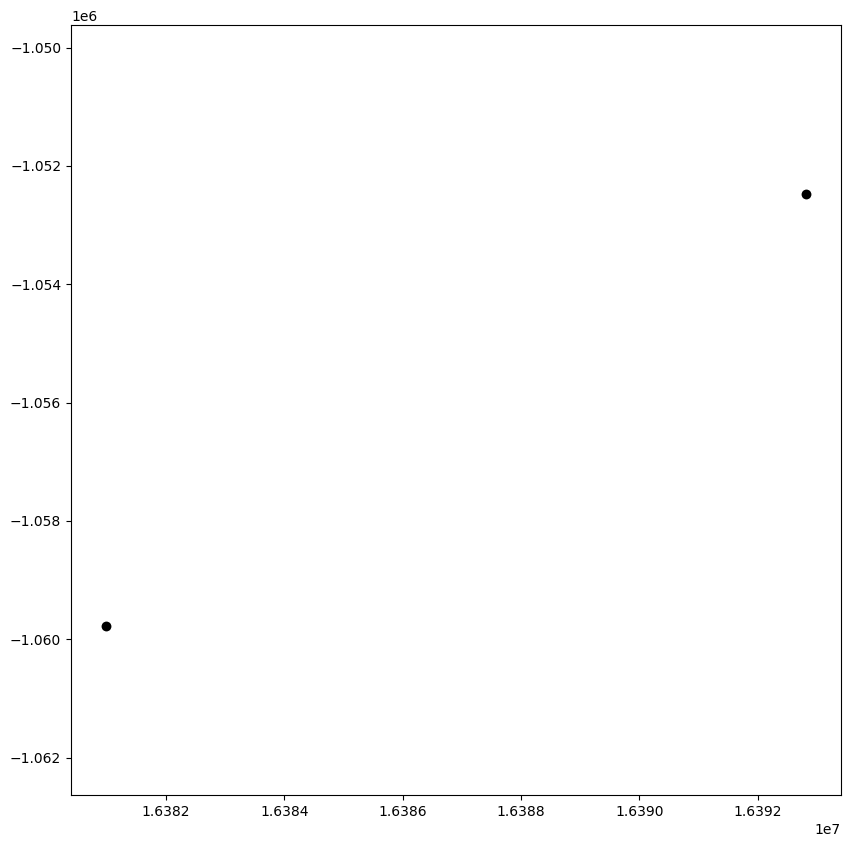

In [ ]:
if manual:
    for o,d, name in od_list:
        url = 'http://a.basemaps.cartocdn.com/dark_nolabels/{z}/{x}/{y}.png'
        ax = plot_sm.plot_car_paths(o, d, figsize=[10, 10], squared=True,
                            basemap_url=url, zoom=14, styles=styles, title='title')
        ax.set_title(name + '\n' + ax.get_title())
        png = output_folder+ 'OD_CAR_' + name + '.png'
        ax.figure.savefig(png, bbox_inches='tight')